## Multi-Bar Classification

Description:
Here, we classify whether price will move up, down, or remain neutral over a fixed horizon (e.g., 5 bars). We label each bar with −1,0,+1 based on future returns exceeding positive/negative thresholds. A classifier (e.g., RandomForestClassifier) then learns to predict these discrete classes, which we translate into trading signals.

#### 📌 Important Note:
This notebook contains *interactive charts generated using Vectorbt.  
GitHub does not display interactive Plotly charts, so the graphs will not be visible here.  

✅ To view the charts, please download this notebook and run it on your local machine.  
Make sure you have Vectorbt and its dependencies installed to regenerate the visualizations.


## Part 1: Data & Feature Engineering

**Objective:**  
Load raw price data (MetaTrader 5 or CSV) and transform it into a feature-rich dataset.

**Tasks:**
- Fetch historical bars  
- Apply `ta.add_all_ta_features` or custom features  
- (Optionally) create specific labels (multi-bar, double-barrier, regime, etc.)  
- Clean/prepare the final feature matrix **X** and target **y**  


===== Symbol: EURUSD =====
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 32ms/step
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
✅ Saved best DL model for EURUSD: LSTM (Sharpe=0.02)

===== Symbol: USDJPY =====
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step
16/16 ━━━━━━━━━━━━━

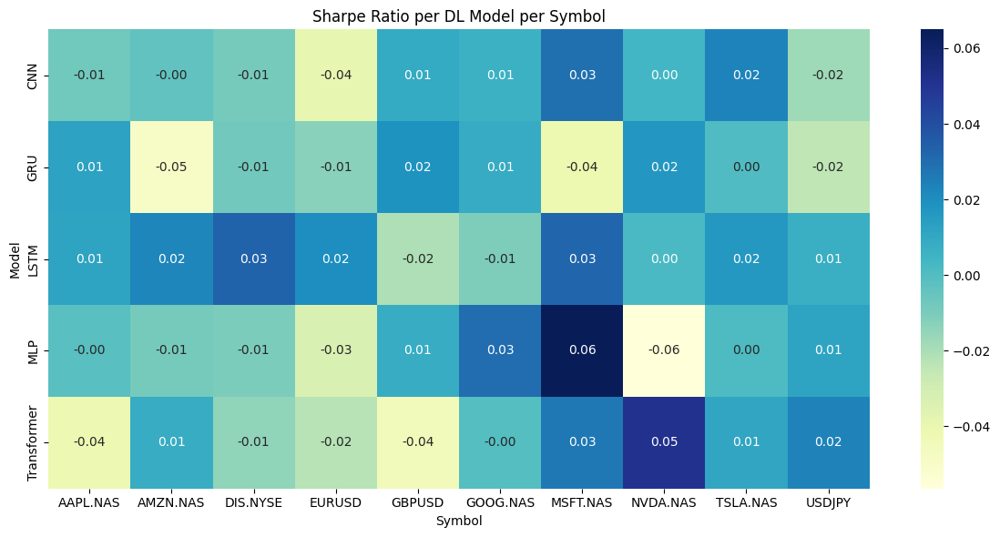

In [1]:
# DL Training Script: Multiple Symbols, Multiple Models, Walk-Forward Evaluation with Saving

import sys
import os
import warnings
from pathlib import Path

project_root = Path.cwd().parent.parent
sys.path.append(str(project_root))
os.chdir(str(project_root))
warnings.filterwarnings("ignore")

import pandas as pd
import numpy as np
import MetaTrader5 as mt5
import joblib
import tensorflow as tf
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, Flatten, Conv1D, GlobalMaxPooling1D, LSTM, Bidirectional, GRU
from tensorflow.keras.optimizers import Adam
import matplotlib.pyplot as plt
import seaborn as sns

from data.data_loader_mt5 import get_data_mt5
from features.feature_engineering import add_all_ta_features
from features.labeling_schemes import calculate_future_returns
from backtests.simple_backtest import simulate_trading, calculate_sharpe_ratio
from models.model_training import walk_forward_splits
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, LayerNormalization, MultiHeadAttention, GlobalAveragePooling1D, Add

# ----------------------------------------------------------------------------
# Setup
# ----------------------------------------------------------------------------
model_folder = Path("models/dl_models")
os.makedirs(model_folder, exist_ok=True)

symbols = ["EURUSD", "USDJPY", "GBPUSD", "AAPL.NAS", "MSFT.NAS", "TSLA.NAS", "GOOG.NAS", "AMZN.NAS", "NVDA.NAS", "DIS.NYSE"]
timeframe = mt5.TIMEFRAME_H4
n_bars = 2000
start_pos = 0
lookback = 10
threshold = 0.0005
cost = 0.0002

if not mt5.initialize():
    raise RuntimeError("Failed to initialize MT5")

# ----------------------------------------------------------------------------
# DL Models
# ----------------------------------------------------------------------------
def create_mlp_model_seq(input_shape):
    model = Sequential([
        Flatten(input_shape=input_shape),
        Dense(64, activation='relu'),
        Dropout(0.2),
        Dense(32, activation='relu'),
        Dense(1)
    ])
    model.compile(optimizer=Adam(0.001), loss='mse')
    return model

def create_cnn_model_seq(input_shape):
    model = Sequential([
        Conv1D(32, kernel_size=3, activation='relu', input_shape=input_shape),
        GlobalMaxPooling1D(),
        Dense(64, activation='relu'),
        Dropout(0.2),
        Dense(1)
    ])
    model.compile(optimizer=Adam(0.001), loss='mse')
    return model

def create_lstm_model_seq(input_shape):
    model = Sequential([
        LSTM(50, input_shape=input_shape),
        Dense(32, activation='relu'),
        Dropout(0.2),
        Dense(1)
    ])
    model.compile(optimizer=Adam(0.001), loss='mse')
    return model

def create_gru_model_seq(input_shape):
    model = Sequential([
        GRU(50, input_shape=input_shape),
        Dense(32, activation='relu'),
        Dropout(0.2),
        Dense(1)
    ])
    model.compile(optimizer=Adam(0.001), loss='mse')
    return model

def create_transformer_model_seq(input_shape):
    inputs = Input(shape=input_shape)
    x = LayerNormalization(epsilon=1e-6)(inputs)
    attention_output = MultiHeadAttention(num_heads=2, key_dim=input_shape[-1])(x, x)
    x = Add()([x, attention_output])
    x = LayerNormalization(epsilon=1e-6)(x)
    x = Dense(64, activation='relu')(x)
    x = Dropout(0.2)(x)
    x = GlobalAveragePooling1D()(x)
    outputs = Dense(1)(x)
    model = Model(inputs, outputs)
    model.compile(optimizer=Adam(learning_rate=0.001), loss='mse')
    return model

dl_models = {
    "MLP": create_mlp_model_seq,
    "CNN": create_cnn_model_seq,
    "LSTM": create_lstm_model_seq,
    "GRU": create_gru_model_seq,
    "Transformer": create_transformer_model_seq
}

# ----------------------------------------------------------------------------
# Helpers
# ----------------------------------------------------------------------------
def create_sequences(X, y, lookback):
    X_seq, y_seq = [], []
    for i in range(lookback, len(X)):
        X_seq.append(X[i-lookback:i])
        y_seq.append(y[i])
    return np.array(X_seq), np.array(y_seq)

# ----------------------------------------------------------------------------
# Main Loop
# ----------------------------------------------------------------------------
results = []

for symbol in symbols:
    print(f"\n===== Symbol: {symbol} =====")
    data = get_data_mt5(symbol=symbol, timeframe=timeframe, n_bars=n_bars, start_pos=start_pos)
    if data is None or len(data) < lookback + 100:
        print(f"⚠️ Not enough data for {symbol}, skipping...")
        continue

    df = add_all_ta_features(data)
    df = calculate_future_returns(df).dropna(subset=["future_returns"])

    X = df.drop(columns=["future_returns"])
    y = df["future_returns"]

    folds = walk_forward_splits(X, y, n_splits=3)
    best_model = None
    best_score = -np.inf

    for model_name, model_fn in dl_models.items():
        fold_sharpes = []
        for fold_i, (X_train, y_train, X_test, y_test) in enumerate(folds):
            scaler = StandardScaler()
            X_train_scaled = scaler.fit_transform(X_train)
            X_test_scaled = scaler.transform(X_test)

            X_train_seq, y_train_seq = create_sequences(X_train_scaled, y_train.values, lookback)
            X_test_seq, y_test_seq = create_sequences(X_test_scaled, y_test.values, lookback)
            test_index = X_test.index[lookback:]

            model = model_fn(X_train_seq.shape[1:])
            model.fit(X_train_seq, y_train_seq, epochs=30, batch_size=32, verbose=0)

            preds = model.predict(X_test_seq).flatten()
            signals = np.where(preds > threshold, 1, np.where(preds < -threshold, -1, 0))
            df_test = df.loc[test_index].copy()
            daily_returns, total_return = simulate_trading(signals, df_test, cost=cost)
            sharpe = calculate_sharpe_ratio(np.array(daily_returns))
            fold_sharpes.append(sharpe)

        avg_sharpe = np.mean(fold_sharpes)
        results.append({"Symbol": symbol, "Model": model_name, "Sharpe": avg_sharpe})

        if avg_sharpe > best_score:
            best_score = avg_sharpe
            best_model = model
            best_scaler = scaler
            best_model_name = model_name

    # Save best model and scaler
    model_path = model_folder / f"{symbol}_{best_model_name}_best_model.keras"
    best_model.save(model_path)
    joblib.dump(best_scaler, model_folder / f"{symbol}_scaler.pkl")
    print(f"✅ Saved best DL model for {symbol}: {best_model_name} (Sharpe={best_score:.2f})")

# ----------------------------------------------------------------------------
# Results Summary
# ----------------------------------------------------------------------------
df_results = pd.DataFrame(results)
pivot_df = df_results.pivot(index="Model", columns="Symbol", values="Sharpe")

plt.figure(figsize=(12, 6))
sns.heatmap(pivot_df, annot=True, fmt=".2f", cmap="YlGnBu")
plt.title("Sharpe Ratio per DL Model per Symbol")
plt.tight_layout()
plt.show()



===== Symbol: EURUSD =====
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 32ms/step
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step
16/16 ━━━━━━━━━━━━━━━━━━━━ 2s 50ms/step
16/16 ━━━━━━━━━━━━━━━━━━━━ 2s 62ms/step
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 34ms/step
16/16 ━━━━━━━━━━━━━━━━━━━━ 2s 90ms/step
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step
✅ Saved best DL model for EURUSD: MLP (Sharpe=0.01)

===== Symbol: USDJPY =====
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step
16/16 ━━━━━━━

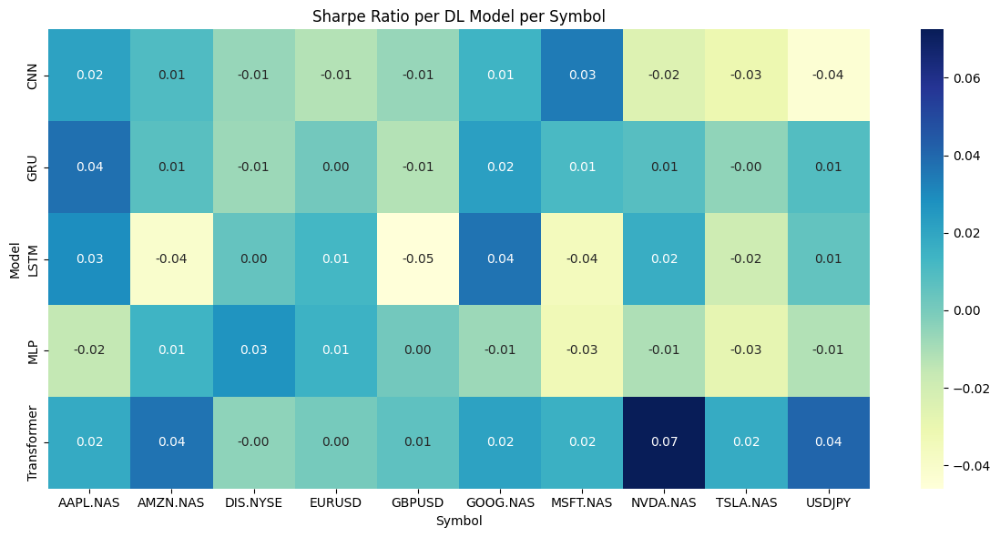

In [1]:
# DL Training Script: Multiple Symbols, Multiple Models, Walk-Forward Evaluation

import sys
import os
import warnings
from pathlib import Path

project_root = Path.cwd().parent.parent
sys.path.append(str(project_root))
os.chdir(str(project_root))
warnings.filterwarnings("ignore")

import warnings
from pathlib import Path
import pandas as pd
import numpy as np
import MetaTrader5 as mt5
import joblib
import tensorflow as tf
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, Flatten, Conv1D, GlobalMaxPooling1D, LSTM, Bidirectional, GRU
from tensorflow.keras.optimizers import Adam
import matplotlib.pyplot as plt
import seaborn as sns

from data.data_loader_mt5 import get_data_mt5
from features.feature_engineering import add_all_ta_features
from features.labeling_schemes import calculate_future_returns
from backtests.simple_backtest import simulate_trading, calculate_sharpe_ratio
from models.model_training import walk_forward_splits

from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Dense, Dropout, LayerNormalization, MultiHeadAttention, GlobalAveragePooling1D, Add
from tensorflow.keras.optimizers import Adam



# ----------------------------------------------------------------------------
# Setup
# ----------------------------------------------------------------------------
project_root = Path.cwd().parent.parent
os.chdir(project_root)
model_folder = project_root / "models/dl_models"
os.makedirs(model_folder, exist_ok=True)

symbols = ["EURUSD", "USDJPY", "GBPUSD", "AAPL.NAS", "MSFT.NAS", "TSLA.NAS", "GOOG.NAS", "AMZN.NAS", "NVDA.NAS", "DIS.NYSE"]
timeframe = mt5.TIMEFRAME_H4
n_bars = 2000
start_pos = 0
lookback = 10
threshold = 0.0005
cost = 0.0002

if not mt5.initialize():
    raise RuntimeError("Failed to initialize MT5")

# ----------------------------------------------------------------------------
# DL Models
# ----------------------------------------------------------------------------
def create_mlp_model_seq(input_shape):
    model = Sequential([
        Flatten(input_shape=input_shape),
        Dense(64, activation='relu'),
        Dropout(0.2),
        Dense(32, activation='relu'),
        Dense(1)
    ])
    model.compile(optimizer=Adam(0.001), loss='mse')
    return model

def create_cnn_model_seq(input_shape):
    model = Sequential([
        Conv1D(32, kernel_size=3, activation='relu', input_shape=input_shape),
        GlobalMaxPooling1D(),
        Dense(64, activation='relu'),
        Dropout(0.2),
        Dense(1)
    ])
    model.compile(optimizer=Adam(0.001), loss='mse')
    return model

def create_lstm_model_seq(input_shape):
    model = Sequential([
        LSTM(50, input_shape=input_shape),
        Dense(32, activation='relu'),
        Dropout(0.2),
        Dense(1)
    ])
    model.compile(optimizer=Adam(0.001), loss='mse')
    return model

def create_bilstm_model_seq(input_shape):
    model = Sequential([
        Bidirectional(LSTM(50), input_shape=input_shape),
        Dense(32, activation='relu'),
        Dropout(0.2),
        Dense(1)
    ])
    model.compile(optimizer=Adam(0.001), loss='mse')
    return model

def create_gru_model_seq(input_shape):
    model = Sequential([
        GRU(50, input_shape=input_shape),
        Dense(32, activation='relu'),
        Dropout(0.2),
        Dense(1)
    ])
    model.compile(optimizer=Adam(0.001), loss='mse')
    return model



def create_transformer_model_seq(input_shape):
    """
    Simple Transformer Encoder for time series forecasting (returns prediction).
    """

    inputs = Input(shape=input_shape)

    # 1) First Normalization
    x = LayerNormalization(epsilon=1e-6)(inputs)

    # 2) Multi-head Self Attention
    attention_output = MultiHeadAttention(num_heads=2, key_dim=input_shape[-1])(x, x)

    # 3) Skip connection
    x = Add()([x, attention_output])
    x = LayerNormalization(epsilon=1e-6)(x)

    # 4) Feed-Forward Network
    x = Dense(64, activation='relu')(x)
    x = Dropout(0.2)(x)

    # 5) Global Average Pooling
    x = GlobalAveragePooling1D()(x)

    # 6) Output Layer
    outputs = Dense(1)(x)  # Regression output (future return)

    model = Model(inputs, outputs)

    model.compile(optimizer=Adam(learning_rate=0.001), loss='mean_squared_error')

    return model


dl_models = {
    "MLP": create_mlp_model_seq,
    "CNN": create_cnn_model_seq,
    "LSTM": create_lstm_model_seq,
    "GRU": create_gru_model_seq,
    "Transformer": create_transformer_model_seq
}


# ----------------------------------------------------------------------------
# Helpers
# ----------------------------------------------------------------------------
def create_sequences(X, y, lookback):
    X_seq, y_seq = [], []
    for i in range(lookback, len(X)):
        X_seq.append(X[i-lookback:i])
        y_seq.append(y[i])
    return np.array(X_seq), np.array(y_seq)

# ----------------------------------------------------------------------------
# Main Loop
# ----------------------------------------------------------------------------
results = []

for symbol in symbols:
    print(f"\n===== Symbol: {symbol} =====")
    data = get_data_mt5(symbol=symbol, timeframe=timeframe, n_bars=n_bars, start_pos=start_pos)
    if data is None or len(data) < lookback + 100:
        print(f"⚠️ Not enough data for {symbol}, skipping...")
        continue

    df = add_all_ta_features(data)
    df = calculate_future_returns(df).dropna(subset=["future_returns"])

    X = df.drop(columns=["future_returns"])
    y = df["future_returns"]

    folds = walk_forward_splits(X, y, n_splits=3)
    best_model = None
    best_score = -np.inf

    for model_name, model_fn in dl_models.items():
        fold_sharpes = []
        for fold_i, (X_train, y_train, X_test, y_test) in enumerate(folds):
            scaler = StandardScaler()
            X_train_scaled = scaler.fit_transform(X_train)
            X_test_scaled = scaler.transform(X_test)

            X_train_seq, y_train_seq = create_sequences(X_train_scaled, y_train.values, lookback)
            X_test_seq, y_test_seq = create_sequences(X_test_scaled, y_test.values, lookback)
            test_index = X_test.index[lookback:]

            model = model_fn(X_train_seq.shape[1:])
            model.fit(X_train_seq, y_train_seq, epochs=30, batch_size=32, verbose=0)

            preds = model.predict(X_test_seq).flatten()
            signals = np.where(preds > threshold, 1, np.where(preds < -threshold, -1, 0))
            df_test = df.loc[test_index].copy()
            daily_returns, total_return = simulate_trading(signals, df_test, cost=cost)
            sharpe = calculate_sharpe_ratio(np.array(daily_returns))
            fold_sharpes.append(sharpe)

        avg_sharpe = np.mean(fold_sharpes)
        results.append({"Symbol": symbol, "Model": model_name, "Sharpe": avg_sharpe})

        if avg_sharpe > best_score:
            best_score = avg_sharpe
            best_model = model
            best_scaler = scaler
            best_model_name = model_name

    # Save best model
    model_path = model_folder / f"{symbol}_{best_model_name}_best_model.keras"
    best_model.save(model_path)
    joblib.dump(best_scaler, model_folder / f"{symbol}_scaler.pkl")
    print(f"✅ Saved best DL model for {symbol}: {best_model_name} (Sharpe={best_score:.2f})")

# ----------------------------------------------------------------------------
# Results Summary
# ----------------------------------------------------------------------------
df_results = pd.DataFrame(results)
pivot_df = df_results.pivot(index="Model", columns="Symbol", values="Sharpe")

plt.figure(figsize=(12, 6))
sns.heatmap(pivot_df, annot=True, fmt=".2f", cmap="YlGnBu")
plt.title("Sharpe Ratio per DL Model per Symbol")
plt.tight_layout()
plt.show()


In [ ]:
# ----------------------------------------------------------------------------
# 0) SETUP
# ----------------------------------------------------------------------------
import sys
import os
import warnings
from pathlib import Path

project_root = Path.cwd().parent.parent
sys.path.append(str(project_root))
os.chdir(str(project_root))
warnings.filterwarnings("ignore")

import pandas as pd
import numpy as np
import MetaTrader5 as mt5
import vectorbt as vbt
import seaborn as sns
import matplotlib.pyplot as plt
import joblib

from data.data_loader_mt5 import get_data_mt5
from features.feature_engineering import add_all_ta_features
from features.labeling_schemes import create_labels_multi_bar
from backtests.simple_backtest import simulate_trading, calculate_sharpe_ratio

from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.svm import SVC
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from sklearn.naive_bayes import GaussianNB, BernoulliNB
from sklearn.metrics import accuracy_score

# ----------------------------------------------------------------------------
# 1) LIST OF SYMBOLS
# ----------------------------------------------------------------------------
symbols = ["EURUSD", "USDJPY", "AUDUSD", "GBPUSD", "USDCHF", "EURGBP", "MSFT.NAS", "TSLA.NAS", "NVDA.NAS", "AMZN.NAS", "GOOGL.NAS", "NFLX.NAS","AAPL.NAS", 
           "BABA.NYSE", "JPM.NYSE", "XOM.NYSE", "BA.NYSE", "DIS.NYSE", "NKE.NYSE"]
timeframe = mt5.TIMEFRAME_H4
n_bars = 10000
start_pos = 0
horizon = 5
threshold = 0.005

# ----------------------------------------------------------------------------
# 2) BACKTESTING MULTIPLE SYMBOLS
# ----------------------------------------------------------------------------
if not mt5.initialize():
    raise RuntimeError("Failed to initialize MT5")

# Prepare folders
model_folder = "models/simple_models"
os.makedirs(model_folder, exist_ok=True)

all_results = []
best_models = {}  # store best model per symbol

for symbol in symbols:
    print(f"\n\n🔵 Processing Symbol: {symbol}")

    data = get_data_mt5(symbol=symbol, timeframe=timeframe, n_bars=n_bars, start_pos=start_pos)
    if data is None or len(data) == 0:
        print(f"⚠️ No data for {symbol}, skipping...")
        continue

    df = add_all_ta_features(data)
    df_lbl = create_labels_multi_bar(df, horizon=horizon, threshold=threshold)

    X = df_lbl.drop(columns=["multi_bar_label", "future_return_h"])
    y = df_lbl["multi_bar_label"]

    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    models = {
        "RandomForestClassifier": RandomForestClassifier(n_estimators=100, random_state=42),
        "GradientBoostingClassifier": GradientBoostingClassifier(n_estimators=100, learning_rate=0.1, max_depth=5, random_state=42),
        "SVC": SVC(C=1.0, kernel='rbf', probability=True),
        "XGBClassifier": XGBClassifier(n_estimators=100, learning_rate=0.1, random_state=42),
        "LGBMClassifier": LGBMClassifier(n_estimators=100, learning_rate=0.1, random_state=42),
        "GaussianNB": GaussianNB(),
        "BernoulliNB": BernoulliNB()
    }

    symbol_model_results = []

    for model_name, model in models.items():
        print(f"⚡ Training {model_name}...")

        model.fit(X_scaled, y + 1)

        preds_shifted = model.predict(X_scaled)
        preds = preds_shifted - 1

        acc = accuracy_score(y, preds)

        signals = preds
        close_prices = df_lbl["close"]
        signals_s = pd.Series(signals, index=close_prices.index)

        pf = vbt.Portfolio.from_signals(
            close_prices,
            entries=signals_s > 0,
            exits=signals_s < 0,
            init_cash=10000,
            freq='4H',
            fees=0.0002
        )

        total_return = pf.total_return()
        sharpe = pf.sharpe_ratio()

        symbol_model_results.append({
            "Symbol": symbol,
            "Model": model_name,
            "Accuracy": acc,
            "Return(%)": total_return,
            "Sharpe": sharpe,
            "FittedModel": model,
            "Scaler": scaler  # keep scaler too
        })

    # Find best model by Sharpe for this symbol
    best_model_info = max(symbol_model_results, key=lambda x: x["Sharpe"])
    best_models[symbol] = best_model_info

    print(f"🏆 Best Model for {symbol}: {best_model_info['Model']} with Sharpe {best_model_info['Sharpe']:.2f}")

    all_results.extend(symbol_model_results)

mt5.shutdown()

# ----------------------------------------------------------------------------
# 3) SAVE BEST MODELS
# ----------------------------------------------------------------------------
for symbol, info in best_models.items():
    save_path = f"{model_folder}/{symbol}_best_model.pkl"
    joblib.dump({
        "model": info["FittedModel"],
        "scaler": info["Scaler"]
    }, save_path)
    print(f"✅ Saved best model for {symbol} to {save_path}")

# ----------------------------------------------------------------------------
# 4) SUMMARY
# ----------------------------------------------------------------------------
summary_df = pd.DataFrame(all_results)
summary_df = summary_df.sort_values(by=["Symbol", "Sharpe"], ascending=[True, False])

print("\n\n✅ Summary Results Across Symbols:")
display(summary_df.round(3))

# ----------------------------------------------------------------------------
# 5) HEATMAP
# ----------------------------------------------------------------------------
pivot_df = summary_df.pivot(index="Model", columns="Symbol", values="Sharpe")

plt.figure(figsize=(12,6))
sns.heatmap(pivot_df, annot=True, fmt=".2f", cmap="YlGnBu")
plt.title("Sharpe Ratio per Model per Symbol")
plt.show()




🔵 Processing Symbol: EURUSD
⚡ Training RandomForestClassifier...
⚡ Training GradientBoostingClassifier...


## Part 2: Backtesting & Performance Evaluation

**Objective:**  
Evaluate how well the trained model performs on unseen data, simulating real trades.

**Tasks:**
- Use walk-forward or expanding splits to mimic “live” conditions  
- Convert model predictions to signals ([-1, 0, +1] or buy/sell/hold)  
- Run a simple backtest script or VectorBT for performance metrics  
- Calculate returns, Sharpe ratio, drawdowns, confusion matrix, etc.  
- Visualize results (equity curve, trades, etc.) to judge strategy viability  



🔵 Backtesting Symbol: US30

✅ Full Backtest Results:
Accuracy=0.98, Return=23.02%, Sharpe=10.10
Start                               2022-01-21 20:00:00
End                                 2025-04-21 20:00:00
Period                                832 days 12:00:00
Start Value                                     10000.0
End Value                                 240219.845863
Total Return [%]                            2302.198459
Benchmark Return [%]                          11.319972
Max Gross Exposure [%]                            100.0
Total Fees Paid                             4870.638044
Max Drawdown [%]                               2.769435
Max Drawdown Duration                   6 days 12:00:00
Total Trades                                        175
Total Closed Trades                                 174
Total Open Trades                                     1
Open Trade PnL                               464.539298
Win Rate [%]                                  97.126437
Best T


📈 Plotting Actual vs Predicted Close...




🔵 Backtesting Symbol: US500

✅ Full Backtest Results:
Accuracy=0.99, Return=42.05%, Sharpe=10.50
Start                               2022-01-21 16:00:00
End                                 2025-04-21 20:00:00
Period                                832 days 12:00:00
Start Value                                     10000.0
End Value                                 430506.755398
Total Return [%]                            4205.067554
Benchmark Return [%]                          15.978662
Max Gross Exposure [%]                            100.0
Total Fees Paid                              8525.33898
Max Drawdown [%]                               3.153407
Max Drawdown Duration                   8 days 08:00:00
Total Trades                                        194
Total Closed Trades                                 193
Total Open Trades                                     1
Open Trade PnL                              2211.976076
Win Rate [%]                                  96.373057
Best 


📈 Plotting Actual vs Predicted Close...




🔵 Backtesting Symbol: XAUUSD

✅ Full Backtest Results:
Accuracy=0.98, Return=26.69%, Sharpe=12.30
Start                               2022-01-27 12:00:00
End                                 2025-04-21 20:00:00
Period                                832 days 12:00:00
Start Value                                     10000.0
End Value                                 276877.170346
Total Return [%]                            2668.771703
Benchmark Return [%]                          90.249729
Max Gross Exposure [%]                            100.0
Total Fees Paid                             5224.530138
Max Drawdown [%]                               1.365229
Max Drawdown Duration                  12 days 12:00:00
Total Trades                                        189
Total Closed Trades                                 188
Total Open Trades                                     1
Open Trade PnL                              6639.075021
Win Rate [%]                                  96.808511
Best


📈 Plotting Actual vs Predicted Close...




🔵 Backtesting Symbol: UK100

✅ Full Backtest Results:
Accuracy=0.99, Return=16.20%, Sharpe=10.73
Start                               2021-12-23 20:00:00
End                                 2025-04-17 20:00:00
Period                                832 days 12:00:00
Start Value                                     10000.0
End Value                                 172017.779016
Total Return [%]                             1620.17779
Benchmark Return [%]                          12.247418
Max Gross Exposure [%]                            100.0
Total Fees Paid                             4124.155459
Max Drawdown [%]                               1.755779
Max Drawdown Duration                  11 days 12:00:00
Total Trades                                        180
Total Closed Trades                                 179
Total Open Trades                                     1
Open Trade PnL                              7951.044239
Win Rate [%]                                  98.324022
Best 


📈 Plotting Actual vs Predicted Close...




🔵 Backtesting Symbol: DE40

✅ Full Backtest Results:
Accuracy=0.99, Return=50.42%, Sharpe=10.97
Start                               2022-01-14 12:00:00
End                                 2025-04-17 20:00:00
Period                                832 days 12:00:00
Start Value                                     10000.0
End Value                                 514235.936211
Total Return [%]                            5042.359362
Benchmark Return [%]                          33.645207
Max Gross Exposure [%]                            100.0
Total Fees Paid                             9444.102718
Max Drawdown [%]                               3.533327
Max Drawdown Duration                   5 days 20:00:00
Total Trades                                        206
Total Closed Trades                                 206
Total Open Trades                                     0
Open Trade PnL                                      0.0
Win Rate [%]                                  97.572816
Best T


📈 Plotting Actual vs Predicted Close...




🔵 Backtesting Symbol: JP225

✅ Full Backtest Results:
Accuracy=0.99, Return=103.41%, Sharpe=11.50
Start                               2022-01-21 00:00:00
End                                 2025-04-21 20:00:00
Period                                832 days 12:00:00
Start Value                                     10000.0
End Value                                 1044135.84456
Total Return [%]                           10341.358446
Benchmark Return [%]                          24.716491
Max Gross Exposure [%]                            100.0
Total Fees Paid                            20989.885266
Max Drawdown [%]                               3.177872
Max Drawdown Duration                   5 days 20:00:00
Total Trades                                        240
Total Closed Trades                                 239
Total Open Trades                                     1
Open Trade PnL                              3819.370362
Win Rate [%]                                   97.48954
Best


📈 Plotting Actual vs Predicted Close...




🔵 Backtesting Symbol: AAPL.NAS

✅ Full Backtest Results:
Accuracy=1.00, Return=252820.15%, Sharpe=12.53
Start                               2012-12-18 00:00:00
End                                 2025-04-16 20:00:00
Period                                832 days 12:00:00
Start Value                                     10000.0
End Value                             2528211476.568713
Total Return [%]                        25282014.765687
Benchmark Return [%]                         155.210655
Max Gross Exposure [%]                            100.0
Total Fees Paid                          29711337.10634
Max Drawdown [%]                               6.474862
Max Drawdown Duration                   6 days 04:00:00
Total Trades                                        359
Total Closed Trades                                 358
Total Open Trades                                     1
Open Trade PnL                           -505642.295314
Win Rate [%]                                  91.34078


📈 Plotting Actual vs Predicted Close...




✅ Final Backtest Results Summary:


,Symbol,Accuracy,Return(%),Sharpe
6,AAPL.NAS,0.997,252820.148,12.528
2,XAUUSD,0.982,26.688,12.302
5,JP225,0.994,103.414,11.503
4,DE40,0.992,50.424,10.971
3,UK100,0.992,16.202,10.728
1,US500,0.992,42.051,10.502
0,US30,0.985,23.022,10.103


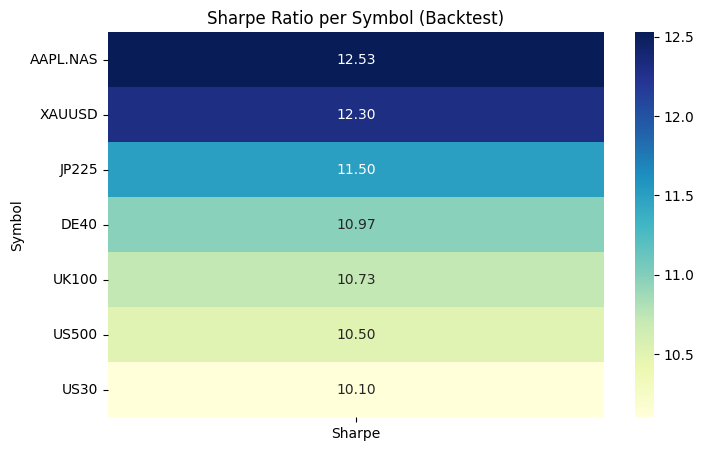

In [1]:
# ----------------------------------------------------------------------------
# 0) SETUP
# ----------------------------------------------------------------------------
import sys
import os
import warnings
from pathlib import Path

project_root = Path.cwd().parent.parent
sys.path.append(str(project_root))
os.chdir(str(project_root))
warnings.filterwarnings("ignore")

import pandas as pd
import numpy as np
import MetaTrader5 as mt5
import vectorbt as vbt
import joblib
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.graph_objects as go

from data.data_loader_mt5 import get_data_mt5
from features.feature_engineering import add_all_ta_features
from features.labeling_schemes import create_labels_multi_bar

# ----------------------------------------------------------------------------
# 1) SYMBOLS TO BACKTEST
# ----------------------------------------------------------------------------
symbols = ["US30", "US500", "XAUUSD", "UK100", "DE40", "JP225", "AAPL.NAS"]
timeframe = mt5.TIMEFRAME_H4
n_bars = 5000
start_pos = 0
horizon = 5
threshold = 0.005

model_folder = "models/simple_models"

# ----------------------------------------------------------------------------
# 2) BACKTESTING
# ----------------------------------------------------------------------------
if not mt5.initialize():
    raise RuntimeError("Failed to initialize MT5")

all_results = []

for symbol in symbols:
    print(f"\n\n🔵 Backtesting Symbol: {symbol}")

    model_path = f"{model_folder}/{symbol}_best_model.pkl"
    if not os.path.exists(model_path):
        print(f"⚠️ Model not found for {symbol}, skipping...")
        continue

    # Load model + scaler
    loaded = joblib.load(model_path)
    model = loaded["model"]
    scaler = loaded["scaler"]

    # Fetch data
    data = get_data_mt5(symbol=symbol, timeframe=timeframe, n_bars=n_bars, start_pos=start_pos)
    if data is None or len(data) == 0:
        print(f"⚠️ No data for {symbol}, skipping...")
        continue

    df = add_all_ta_features(data)
    df_lbl = create_labels_multi_bar(df, horizon=horizon, threshold=threshold)

    X = df_lbl.drop(columns=["multi_bar_label", "future_return_h"])
    y = df_lbl["multi_bar_label"]

    X_scaled = scaler.transform(X)

    preds_shifted = model.predict(X_scaled)
    preds = preds_shifted - 1

    acc = (preds == y).mean()

    # Create signals
    close_prices = df_lbl["close"]
    signals = preds
    signals_s = pd.Series(signals, index=close_prices.index)

    pf = vbt.Portfolio.from_signals(
        close=close_prices,
        entries=signals_s > 0,
        exits=signals_s < 0,
        init_cash=10000,
        freq="4H",
        fees=0.0002
    )

    total_return = pf.total_return()
    sharpe = pf.sharpe_ratio()

    all_results.append({
        "Symbol": symbol,
        "Accuracy": acc,
        "Return(%)": total_return,
        "Sharpe": sharpe
    })

    # ----------------------------------------------------------------------------
    # 3) BACKTEST RESULTS
    # ----------------------------------------------------------------------------
    print("\n✅ Full Backtest Results:")
    print(f"Accuracy={acc:.2f}, Return={total_return:.2f}%, Sharpe={sharpe:.2f}")
    print(pf.stats())

    # Plot Portfolio Equity Curve
    pf.plot(title=f"Backtest: {symbol}").show()

    # ----------------------------------------------------------------------------
    # 4) ACTUAL vs PREDICTED PRICE PLOT
    # ----------------------------------------------------------------------------
    print("\n📈 Plotting Actual vs Predicted Close...")

    actual_close = close_prices.copy()

    pred_movement = preds
    predicted_close = actual_close.copy()

    for idx in range(len(predicted_close) - horizon):
        window = pred_movement[idx: idx + horizon]
        predicted_close.iloc[idx + horizon] = predicted_close.iloc[idx] * (1 + 0.001 * window.sum())

    predicted_close = predicted_close.shift(-horizon)

    fig = go.Figure()

    fig.add_trace(go.Scatter(
        x=actual_close.index,
        y=actual_close,
        mode='lines',
        name='Actual Close',
        line=dict(color='black')
    ))

    fig.add_trace(go.Scatter(
        x=predicted_close.index,
        y=predicted_close,
        mode='lines',
        name='Predicted Close',
        line=dict(color='orange')
    ))

    fig.update_layout(
        title=f"📈 Actual vs Predicted Close Price (horizon={horizon}) for {symbol}",
        xaxis_title="Date",
        yaxis_title="Price",
        template="plotly_white",
        legend=dict(x=0, y=1, bgcolor="rgba(255,255,255,0)", bordercolor="Black"),
        height=700
    )

    fig.show()

mt5.shutdown()

# ----------------------------------------------------------------------------
# 5) FINAL SUMMARY
# ----------------------------------------------------------------------------
results_df = pd.DataFrame(all_results)
results_df = results_df.sort_values(by="Sharpe", ascending=False)

print("\n\n✅ Final Backtest Results Summary:")
display(results_df.round(3))

# ----------------------------------------------------------------------------
# 6) HEATMAP
# ----------------------------------------------------------------------------

pivot_df = results_df.set_index("Symbol")[["Sharpe"]]  # <- fixed

plt.figure(figsize=(8, 5))
sns.heatmap(pivot_df, annot=True, fmt=".2f", cmap="YlGnBu")
plt.title("Sharpe Ratio per Symbol (Backtest)")
plt.show()



## Part 3: Model Training & Hyperparameter Tuning

**Objective:**  
Train an ML model (e.g., RandomForest, XGBoost) on the engineered features to predict the chosen labels.

**Tasks:**
- Perform time-based or walk-forward splits  
- Select top features if desired (e.g., using RandomForest feature importance)  
- Use `RandomizedSearchCV` or `GridSearchCV` to find optimal hyperparameters  
- Save the best model pipeline (e.g., `best_rf_pipeline.pkl`) 

In [1]:
# ----------------------------------------------------------------------------
# FINAL PRO VERSION: Multi-Symbol Model Optimization with Optuna + TimeSeriesSplit
# ----------------------------------------------------------------------------

import sys
import os
import warnings
from pathlib import Path

# ---------------------------------------------------------------------------
# 0) SETUP
# ---------------------------------------------------------------------------
project_root = Path.cwd().parent.parent
sys.path.append(str(project_root))
os.chdir(str(project_root))
warnings.filterwarnings("ignore")

import pandas as pd
import numpy as np
import MetaTrader5 as mt5
import joblib
import optuna

from data.data_loader_mt5 import get_data_mt5
from features.feature_engineering import add_all_ta_features
from features.labeling_schemes import create_labels_multi_bar
from sklearn.model_selection import TimeSeriesSplit
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.metrics import accuracy_score

# ----------------------------------------------------------------------------
# 1) CONFIGURATION
# ----------------------------------------------------------------------------
symbols = ["US30", "US500", "DE40", "JP225", "UK100", "XAUUSD"]
timeframe = mt5.TIMEFRAME_H4
n_bars = 10000
start_pos = 5000
horizon = 5
threshold = 0.005
folds = 3
trials = 50

save_folder = "models/rf_models"
os.makedirs(save_folder, exist_ok=True)

summary_rows = []

# ----------------------------------------------------------------------------
# 2) START MULTI-SYMBOL OPTIMIZATION
# ----------------------------------------------------------------------------
print("\n⚡ Starting MT5 connection...")
if not mt5.initialize():
    raise RuntimeError("❌ Failed to initialize MT5")

for symbol in symbols:
    print(f"\n\n🔵 Optimizing Symbol: {symbol}")

    # Fetch Data
    data = get_data_mt5(symbol=symbol, timeframe=timeframe, n_bars=n_bars, start_pos=start_pos)
    if data is None or len(data) < 1000:
        print(f"⚠️ Not enough data for {symbol}, skipping...")
        continue

    df = add_all_ta_features(data)
    df_lbl = create_labels_multi_bar(df, horizon=horizon, threshold=threshold)

    X = df_lbl.drop(columns=["multi_bar_label", "future_return_h"])
    y = df_lbl["multi_bar_label"]

    tscv = TimeSeriesSplit(n_splits=folds)

    # Define Optuna Objective
    def objective(trial):
        params = {
            "n_estimators": trial.suggest_int("n_estimators", 100, 1000, step=100),
            "max_depth": trial.suggest_int("max_depth", 5, 30),
            "min_samples_split": trial.suggest_int("min_samples_split", 2, 20),
            "max_features": trial.suggest_categorical("max_features", ["sqrt", "log2", 0.5, 0.8, None])
        }

        model = Pipeline([
            ("scaler", StandardScaler()),
            ("rf", RandomForestClassifier(**params, random_state=42))
        ])

        scores = []
        for train_idx, test_idx in tscv.split(X):
            X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
            y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]

            model.fit(X_train, y_train + 1)
            preds = model.predict(X_test)
            scores.append(accuracy_score(y_test + 1, preds))

        return np.mean(scores)

    # Run Optuna
    study = optuna.create_study(direction="maximize")
    study.optimize(objective, n_trials=trials)

    print(f"✅ Best Params for {symbol}: {study.best_params}")

    # Retrain best model
    best_params = study.best_params

    best_model = Pipeline([
        ("scaler", StandardScaler()),
        ("rf", RandomForestClassifier(
            n_estimators=best_params["n_estimators"],
            max_depth=best_params["max_depth"],
            min_samples_split=best_params["min_samples_split"],
            max_features=best_params["max_features"],
            random_state=42
        ))
    ])

    best_model.fit(X, y + 1)

    # Save model
    model_path = os.path.join(save_folder, f"{symbol}_best_model.pkl")
    joblib.dump(best_model, model_path)

    print(f"💾 Saved best model for {symbol} to {model_path}")

    # Save best performance in summary
    summary_rows.append({
        "Symbol": symbol,
        "BestParams": study.best_params,
        "BestAccuracy": study.best_value
    })

mt5.shutdown()
print("\n✅ All symbols optimized. MT5 connection closed.")

# ----------------------------------------------------------------------------
# 3) SAVE SUMMARY TABLE
# ----------------------------------------------------------------------------
summary_df = pd.DataFrame(summary_rows)
summary_path = os.path.join(save_folder, "summary_results.csv")
summary_df.to_csv(summary_path, index=False)

print(f"\n📄 Saved optimization summary to {summary_path}")
print(summary_df)



⚡ Starting MT5 connection...


🔵 Optimizing Symbol: US30


[I 2025-04-20 20:03:10,194] A new study created in memory with name: no-name-725b04f3-aa18-4218-999d-7915391bbee9
[I 2025-04-20 20:05:11,447] Trial 0 finished with value: 0.4966639978649587 and parameters: {'n_estimators': 700, 'max_depth': 11, 'min_samples_split': 11, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.4966639978649587.
[I 2025-04-20 20:27:57,500] Trial 1 finished with value: 0.33626901521216973 and parameters: {'n_estimators': 500, 'max_depth': 22, 'min_samples_split': 12, 'max_features': None}. Best is trial 0 with value: 0.4966639978649587.
[I 2025-04-20 20:30:29,470] Trial 2 finished with value: 0.4683746997598078 and parameters: {'n_estimators': 700, 'max_depth': 27, 'min_samples_split': 2, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.4966639978649587.
[I 2025-04-20 20:32:43,239] Trial 3 finished with value: 0.4707766212970377 and parameters: {'n_estimators': 600, 'max_depth': 28, 'min_samples_split': 9, 'max_features': 'sqrt'}. Best is trial 0 with 

✅ Best Params for US30: {'n_estimators': 200, 'max_depth': 5, 'min_samples_split': 15, 'max_features': 'log2'}
💾 Saved best model for US30 to models/rf_models\US30_best_model.pkl


🔵 Optimizing Symbol: US500


[I 2025-04-21 00:00:22,288] A new study created in memory with name: no-name-1e63308f-4a9a-46d6-8cd1-c64b6cde87a7
[I 2025-04-21 00:01:37,208] Trial 0 finished with value: 0.4324793167867627 and parameters: {'n_estimators': 400, 'max_depth': 23, 'min_samples_split': 14, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.4324793167867627.
[I 2025-04-21 00:30:08,876] Trial 1 finished with value: 0.3564184681078196 and parameters: {'n_estimators': 1000, 'max_depth': 14, 'min_samples_split': 10, 'max_features': None}. Best is trial 0 with value: 0.4324793167867627.
[I 2025-04-21 00:33:53,872] Trial 2 finished with value: 0.3576194288764345 and parameters: {'n_estimators': 200, 'max_depth': 26, 'min_samples_split': 5, 'max_features': 0.5}. Best is trial 0 with value: 0.4324793167867627.
[I 2025-04-21 00:44:00,634] Trial 3 finished with value: 0.47838270616493195 and parameters: {'n_estimators': 900, 'max_depth': 9, 'min_samples_split': 6, 'max_features': 0.5}. Best is trial 3 with value:

✅ Best Params for US500: {'n_estimators': 800, 'max_depth': 5, 'min_samples_split': 15, 'max_features': 'log2'}
💾 Saved best model for US500 to models/rf_models\US500_best_model.pkl


🔵 Optimizing Symbol: DE40


[I 2025-04-21 02:58:08,014] A new study created in memory with name: no-name-44a35965-984f-4d7a-865d-60e3d04cb312
[I 2025-04-21 02:58:21,529] Trial 0 finished with value: 0.3151344841429145 and parameters: {'n_estimators': 100, 'max_depth': 13, 'min_samples_split': 16, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.3151344841429145.
[I 2025-04-21 02:59:14,799] Trial 1 finished with value: 0.32195905258932156 and parameters: {'n_estimators': 500, 'max_depth': 24, 'min_samples_split': 6, 'max_features': 'log2'}. Best is trial 1 with value: 0.32195905258932156.
[I 2025-04-21 03:05:55,202] Trial 2 finished with value: 0.2965341897497658 and parameters: {'n_estimators': 300, 'max_depth': 15, 'min_samples_split': 11, 'max_features': None}. Best is trial 1 with value: 0.32195905258932156.
[I 2025-04-21 03:09:32,661] Trial 3 finished with value: 0.37414692894419915 and parameters: {'n_estimators': 300, 'max_depth': 6, 'min_samples_split': 6, 'max_features': None}. Best is trial 3 with 

✅ Best Params for DE40: {'n_estimators': 800, 'max_depth': 5, 'min_samples_split': 18, 'max_features': 'log2'}
💾 Saved best model for DE40 to models/rf_models\DE40_best_model.pkl


🔵 Optimizing Symbol: JP225


[I 2025-04-21 06:31:25,383] A new study created in memory with name: no-name-163d554e-5fad-4959-9afd-fd0dae7ec105
[I 2025-04-21 06:34:32,354] Trial 0 finished with value: 0.34414198025086734 and parameters: {'n_estimators': 300, 'max_depth': 7, 'min_samples_split': 20, 'max_features': 0.8}. Best is trial 0 with value: 0.34414198025086734.
[I 2025-04-21 06:35:16,824] Trial 1 finished with value: 0.32412596744061917 and parameters: {'n_estimators': 300, 'max_depth': 16, 'min_samples_split': 19, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.34414198025086734.
[I 2025-04-21 06:39:15,076] Trial 2 finished with value: 0.3142514011208967 and parameters: {'n_estimators': 200, 'max_depth': 26, 'min_samples_split': 18, 'max_features': 0.8}. Best is trial 0 with value: 0.34414198025086734.
[I 2025-04-21 06:44:06,906] Trial 3 finished with value: 0.3121163597544703 and parameters: {'n_estimators': 400, 'max_depth': 23, 'min_samples_split': 20, 'max_features': 0.5}. Best is trial 0 with va

✅ Best Params for JP225: {'n_estimators': 1000, 'max_depth': 5, 'min_samples_split': 12, 'max_features': 'log2'}
💾 Saved best model for JP225 to models/rf_models\JP225_best_model.pkl


🔵 Optimizing Symbol: UK100


[I 2025-04-21 11:39:21,953] A new study created in memory with name: no-name-f6502bb0-70e9-41e8-85cf-08ecf4401174
[I 2025-04-21 11:41:47,988] Trial 0 finished with value: 0.4531502423263327 and parameters: {'n_estimators': 600, 'max_depth': 25, 'min_samples_split': 13, 'max_features': 'log2'}. Best is trial 0 with value: 0.4531502423263327.
[I 2025-04-21 11:44:23,487] Trial 1 finished with value: 0.46607431340872374 and parameters: {'n_estimators': 800, 'max_depth': 7, 'min_samples_split': 10, 'max_features': 'sqrt'}. Best is trial 1 with value: 0.46607431340872374.
[I 2025-04-21 11:51:44,936] Trial 2 finished with value: 0.4254173397953689 and parameters: {'n_estimators': 200, 'max_depth': 12, 'min_samples_split': 4, 'max_features': 0.8}. Best is trial 1 with value: 0.46607431340872374.
[I 2025-04-21 11:55:55,942] Trial 3 finished with value: 0.44803446418955306 and parameters: {'n_estimators': 700, 'max_depth': 23, 'min_samples_split': 10, 'max_features': 'sqrt'}. Best is trial 1 wit

✅ Best Params for UK100: {'n_estimators': 900, 'max_depth': 5, 'min_samples_split': 19, 'max_features': 0.5}
💾 Saved best model for UK100 to models/rf_models\UK100_best_model.pkl


🔵 Optimizing Symbol: XAUUSD


[I 2025-04-21 23:16:53,783] A new study created in memory with name: no-name-ff9e7233-2643-4a14-8e74-706391003f43
[I 2025-04-21 23:17:23,187] Trial 0 finished with value: 0.37950360288230583 and parameters: {'n_estimators': 100, 'max_depth': 24, 'min_samples_split': 17, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.37950360288230583.
[I 2025-04-21 23:52:04,209] Trial 1 finished with value: 0.4551641313050441 and parameters: {'n_estimators': 1000, 'max_depth': 19, 'min_samples_split': 20, 'max_features': 0.8}. Best is trial 1 with value: 0.4551641313050441.
[I 2025-04-21 23:53:05,934] Trial 2 finished with value: 0.39738457432612756 and parameters: {'n_estimators': 400, 'max_depth': 17, 'min_samples_split': 5, 'max_features': 'log2'}. Best is trial 1 with value: 0.4551641313050441.
[I 2025-04-21 23:53:51,510] Trial 3 finished with value: 0.40872698158526816 and parameters: {'n_estimators': 200, 'max_depth': 19, 'min_samples_split': 3, 'max_features': 'sqrt'}. Best is trial 1 wi

✅ Best Params for XAUUSD: {'n_estimators': 800, 'max_depth': 5, 'min_samples_split': 10, 'max_features': None}
💾 Saved best model for XAUUSD to models/rf_models\XAUUSD_best_model.pkl

✅ All symbols optimized. MT5 connection closed.

📄 Saved optimization summary to models/rf_models\summary_results.csv
   Symbol                                         BestParams  BestAccuracy
0    US30  {'n_estimators': 200, 'max_depth': 5, 'min_sam...      0.580998
1   US500  {'n_estimators': 800, 'max_depth': 5, 'min_sam...      0.570857
2    DE40  {'n_estimators': 800, 'max_depth': 5, 'min_sam...      0.520541
3   JP225  {'n_estimators': 1000, 'max_depth': 5, 'min_sa...      0.408727
4   UK100  {'n_estimators': 900, 'max_depth': 5, 'min_sam...      0.532714
5  XAUUSD  {'n_estimators': 800, 'max_depth': 5, 'min_sam...      0.560448
